## Phase 2 – Tile matching & puzzle assembly experiments

This notebook builds on **Phase 1 outputs** (enhanced + sliced tiles) and explores multiple ways to match/assemble tiles.

**Inputs on disk**
- Sliced tiles: `./results/enhanced_images_sliced/<puzzle_size>/<puzzle_id>/*.png`
- (Optional, for validation/reference-based assembly) Correct full images: `../data/correct/<id>.png`
- (Optional) Scrambled full images: `../data/<puzzle_size>/<id>.jpg`

**What you’ll see in this notebook**
1. **Contour/shape-based edge matching (classical CV)**: extract a contour per tile, split into 4 edges, classify each edge (flat/convex/concave), build a rotation-invariant descriptor, then match convex↔concave edges.
2. **Grid assembly from pixel-boundary costs**: compute boundary-strip SSD costs between tiles and solve placement using brute force (2×2) or beam search (4×4, 8×8).
3. **Reference-based reconstruction + evaluation**: identify the likely correct image (top‑K via histogram), assign tiles to correct positions using the Hungarian algorithm (including rotations), then report MSE and save merged outputs.

**Main outputs**
- Assembled/merged images saved under: `./results/merged_images/<puzzle_size>/<puzzle_id>.png`
- A results table (`results_df`) summarizing per-puzzle runtime + MSE (when reference images are available).

In [116]:
import os
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt

SLICED_ROOT = "./results/enhanced_images_sliced"
EDGES_ROOT = "./results/edges_detection_results"

COLORS = {"flat": (180, 180, 180), "convex": (50, 200, 50), "concave": (220, 70, 70)}

## 1) Contour extraction (largest external contour)

We convert one tile image into a clean binary mask and extract a single outline contour.

**Steps**
- BGR → grayscale → Gaussian blur
- Otsu thresholding (auto threshold)
- Morphology close→open to remove small holes/noise
- `findContours(..., RETR_EXTERNAL, CHAIN_APPROX_NONE)` and keep the largest contour by area
- Enforce **counter-clockwise (CCW)** orientation so later “outward” tests are consistent

**Returns**
- `img_bgr`: original tile image
- `contour`: $(N,2)$ float points of the boundary
- `mask`: binary image used for contour extraction (also useful for overlap/collision checks)

**Assumption**
This works best when the tile background is reasonably separable from the piece content using thresholding (Otsu).

In [117]:
def load_piece_and_contour(path: str):
    img_bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    if img_bgr is None:
        raise FileNotFoundError(f'Cannot read image: {path}')
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    _, mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((3, 3), np.uint8), iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8), iterations=1)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    if not contours:
        raise RuntimeError(f'No contour found in {path}')
    contour = max(contours, key=cv2.contourArea)[:, 0, :].astype(np.float32)
    if cv2.contourArea(contour) < 0:  # force CCW
        contour = contour[::-1]
    return img_bgr, contour, mask

## 2) Split a contour into 4 edge segments (rotation-neutral)

A jigsaw “piece” has 4 sides. We approximate those sides by splitting the boundary into four consecutive arcs.

**How it works**
- PCA finds a dominant orientation for the contour points.
- In the PCA-aligned space, we find four extreme points (top/right/bottom/left).
- We then slice the **original CCW contour** between these indices to obtain four edge segments.

**Notes**
- The edge segments are returned in CCW order (between successive breakpoints).
- These edges are “approximately” the four sides; for irregular shapes, the extreme points are a heuristic but often good enough for matching.

In [118]:
def pca_align(contour: np.ndarray):
    pts = contour.astype(np.float32)
    mean, eigvecs = cv2.PCACompute(pts, mean=None, maxComponents=2)
    R = eigvecs
    rotated = (pts - mean) @ R.T
    return rotated, R, mean

def extreme_indices(rotated: np.ndarray):
    return [np.argmin(rotated[:, 1]), np.argmax(rotated[:, 0]), np.argmax(rotated[:, 1]), np.argmin(rotated[:, 0])]

def slice_contour(contour: np.ndarray, i: int, j: int):
    n = len(contour)
    if i <= j:
        return contour[i:j+1].copy()
    return np.vstack([contour[i:], contour[:j+1]])

def split_contour_into_edges(contour: np.ndarray):
    rotated, R, mean = pca_align(contour)
    idxs = extreme_indices(rotated)
    edges = []
    for k in range(4):
        a = idxs[k]
        b = idxs[(k + 1) % 4]
        pts = slice_contour(contour, a, b)
        edges.append({"pts": pts, "start_idx": a, "end_idx": b, "R": R, "mean": mean.flatten()})
    return edges

## 3) Edge typing (flat / convex / concave)

Each extracted edge segment is classified into one of:
- **flat**: likely a border edge
- **convex**: “tab” (sticking out)
- **concave**: “blank” (indentation)

**Method**
- Let the segment endpoints define a **chord**.
- Compute signed distances of edge points to that chord.
- If the maximum deviation is small relative to chord length (default `flat_thresh=0.05`), label as **flat**.
- Otherwise, determine the sign so that “outward” is consistent: we compare the chord normal with the vector from the contour centroid to the edge midpoint, then label **convex** vs **concave** based on the mean signed distance.

**Caveat**
The convex/concave decision depends on the centroid/outward heuristic and assumes the contour orientation is CCW.

In [119]:
def signed_distances_to_chord(pts: np.ndarray):
    a, b = pts[0], pts[-1]
    chord = b - a
    denom = np.linalg.norm(chord) + 1e-6
    cross = chord[0] * (pts[:, 1] - a[1]) - chord[1] * (pts[:, 0] - a[0])
    return cross / denom

def classify_edge(pts: np.ndarray, centroid: np.ndarray, flat_thresh: float = 0.05):
    pts = pts.astype(np.float32)
    chord = pts[-1] - pts[0]
    chord_len = float(np.linalg.norm(chord) + 1e-6)
    signed_d = signed_distances_to_chord(pts)
    flat = float(np.max(np.abs(signed_d)) / chord_len) < flat_thresh
    mid = 0.5 * (pts[0] + pts[-1])
    outward = mid - centroid
    if np.linalg.norm(outward) < 1e-6:
        outward = np.array([0.0, 1.0], dtype=np.float32)
    normal = np.array([-chord[1], chord[0]], dtype=np.float32)
    normal /= np.linalg.norm(normal) + 1e-6
    sign_out = np.sign(np.dot(normal, outward)) or 1.0
    signed_out = signed_d * sign_out
    label = "flat" if flat else ("convex" if np.mean(signed_out) > 0 else "concave")
    return {"label": label, "chord_len": chord_len, "max_abs_dev": float(np.max(np.abs(signed_d))), "mean_signed": float(np.mean(signed_out))}

## 4) Rotation-invariant edge descriptors

We need an edge signature that still matches even if a tile is rotated.

**Descriptor construction**
1. **Resample by arc length** to a fixed number of points (`num=128`) so every edge has the same length representation.
2. Compute a **turning-angle signature** from the resampled curve: for each step, $\theta_i = \arctan2(\Delta y_i, \Delta x_i)$.
3. Use `unwrap` to remove $2\pi$ discontinuities, then subtract the first angle so a global rotation adds a constant that cancels: $\theta \leftarrow \theta - \theta_0$.
4. Approximate **curvature** with a discrete difference of angles: $\kappa_i \approx \Delta\theta_i$.
5. Concatenate `[theta, kappa]` and z‑score normalize (mean 0, std 1).

**Output**
- `descriptor`: a fixed-length vector used for matching (lower distance ⇒ more similar shape)
- `resampled`: the resampled edge points (useful for visualization/alignment)

In [120]:
def resample_curve(pts: np.ndarray, num: int = 128):
    d = np.linalg.norm(np.diff(pts, axis=0), axis=1)
    s = np.concatenate([[0.0], np.cumsum(d)])
    if s[-1] < 1e-6:
        return np.repeat(pts[:1], num, axis=0)
    t = np.linspace(0, s[-1], num)
    x = np.interp(t, s, pts[:, 0])
    y = np.interp(t, s, pts[:, 1])
    return np.stack([x, y], axis=1).astype(np.float32)

def turning_angle_signature(curve: np.ndarray):
    d = np.diff(curve, axis=0)
    ang = np.arctan2(d[:, 1], d[:, 0])
    ang = np.unwrap(ang)
    ang -= ang[0]  # rotation invariance
    return ang

def edge_descriptor(edge_pts: np.ndarray, num: int = 128):
    r = resample_curve(edge_pts, num)
    theta = turning_angle_signature(r)
    kappa = np.diff(theta, prepend=theta[0])
    desc = np.concatenate([theta, kappa])
    desc = (desc - desc.mean()) / (desc.std() + 1e-6)
    return desc, r

## 5) Edge matching (convex ↔ concave only)

Once each tile edge has a type and descriptor, we search for compatible pairs.

**Rules**
- Only match **convex → concave** (tab into blank).
- Do not match edges from the same tile.

**Score**
- Distance = Euclidean norm between normalized descriptors.
- Keep only pairs with `distance <= max_dist`, then return the best `top_k` matches.

**Result**
A list of candidate matches sorted by increasing distance (`score`). Lower is better.

In [121]:
def analyze_piece(path: str, flat_thresh: float = 0.05):
    img, contour, mask = load_piece_and_contour(path)
    centroid = contour.mean(axis=0)
    edges_raw = split_contour_into_edges(contour)
    edges = []
    for idx, e in enumerate(edges_raw):
        cls = classify_edge(e['pts'], centroid, flat_thresh)
        desc, resampled = edge_descriptor(e['pts'])
        edges.append({"piece": path, "edge_idx": idx, "label": cls['label'], "stats": cls, "pts": e['pts'], "resampled": resampled, "descriptor": desc, "centroid": centroid})
    return {"image": img, "contour": contour, "edges": edges}

def match_edges(pieces: list, max_dist: float = 35.0, top_k: int = 20):
    convex = []
    concave = []
    for p in pieces:
        for e in p['edges']:
            if e['label'] == 'convex':
                convex.append(e)
            elif e['label'] == 'concave':
                concave.append(e)
    matches = []
    for a in convex:
        for b in concave:
            if a['piece'] == b['piece']:
                continue
            d = float(np.linalg.norm(a['descriptor'] - b['descriptor']))
            if d <= max_dist:
                matches.append({"score": d, "convex": a, "concave": b})
    matches.sort(key=lambda m: m['score'])
    return matches[:top_k]

## 6) Visualization helpers (sanity checks)

These helpers are for debugging and qualitative inspection:
- Overlay a detected edge segment on the source tile.
- Display a candidate convex/concave match side-by-side with its score.

This is meant to validate that contour extraction, edge splitting, and descriptor matching are behaving sensibly before attempting full assembly.

In [122]:
def draw_edge_on_image(img_bgr: np.ndarray, edge_pts: np.ndarray, color=(0, 255, 0)):
    vis = img_bgr.copy()
    pts_i = edge_pts.astype(np.int32).reshape(-1, 1, 2)
    cv2.polylines(vis, [pts_i], isClosed=False, color=color, thickness=2)
    return vis


def visualize_match(match):
    a = match['convex']
    b = match['concave']
    img_a, _, _ = load_piece_and_contour(a['piece'])
    img_b, _, _ = load_piece_and_contour(b['piece'])
    vis_a = draw_edge_on_image(img_a, a['pts'], COLORS['convex'])
    vis_b = draw_edge_on_image(img_b, b['pts'], COLORS['concave'])

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(vis_a, cv2.COLOR_BGR2RGB))
    plt.title('convex edge {}'.format(a['edge_idx']))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(vis_b, cv2.COLOR_BGR2RGB))
    plt.title('concave edge {}'.format(b['edge_idx']))
    plt.axis('off')

    plt.suptitle('score = {:.2f}'.format(match['score']))
    plt.tight_layout()
    plt.show()

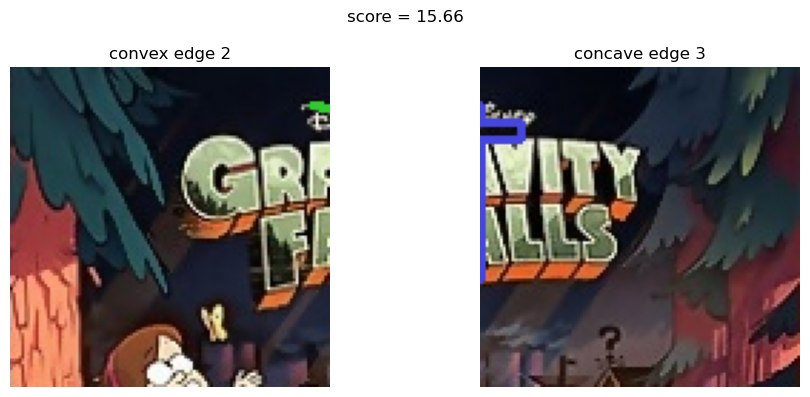

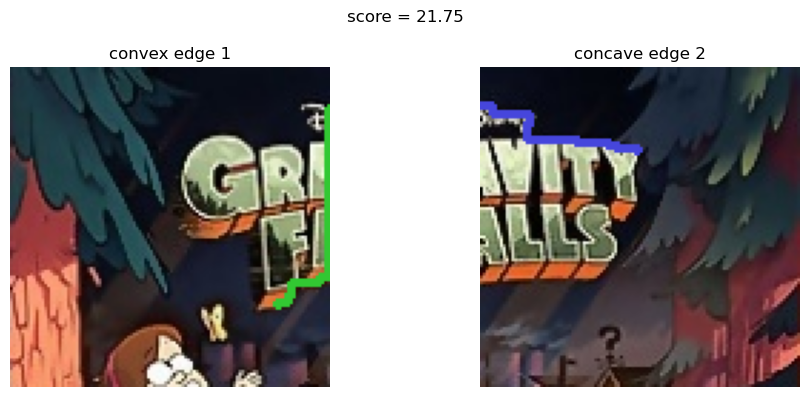

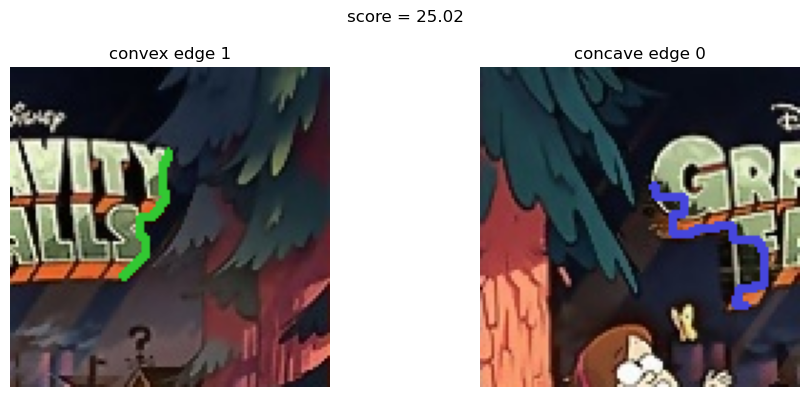

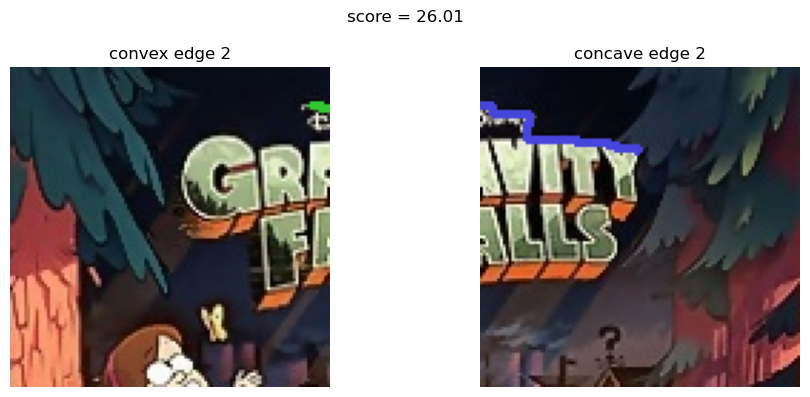

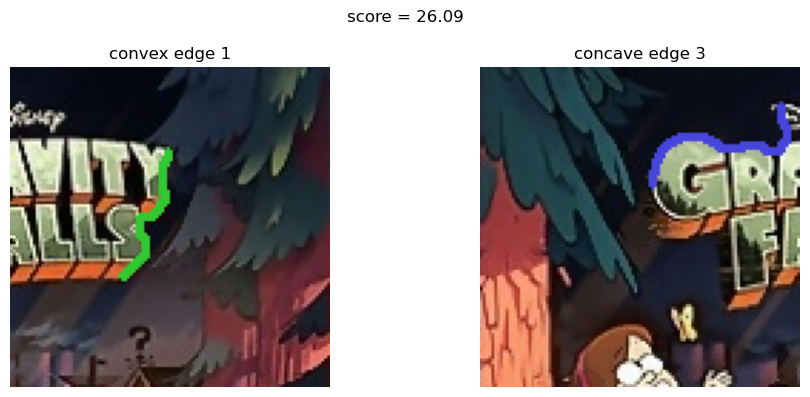

In [123]:
# Example harness (will auto-pick first two tiles it finds).
# Run this after Phase1 artifacts exist on disk.
def find_first_tiles(root=SLICED_ROOT, puzzle='puzzle_2x2', limit=2):
    found = []
    base = os.path.join(root, puzzle)
    if not os.path.isdir(base):
        return found
    for sub in sorted(os.listdir(base)):
        subdir = os.path.join(base, sub)
        if not os.path.isdir(subdir):
            continue
        for f in sorted(os.listdir(subdir)):
            if f.lower().endswith(('.png', '.jpg', '.jpeg')):
                found.append(os.path.join(subdir, f))
                if len(found) >= limit:
                    return found
    return found

sample_paths = find_first_tiles()
pieces = [analyze_piece(p) for p in sample_paths]
matches = match_edges(pieces, max_dist=35, top_k=5)
for m in matches:
    visualize_match(m)

## 7) From edge matches to an assembled layout (proof-of-concept)

Goal: build a partial assembly on a large canvas using only the contour-based matches above.

**High-level idea**
- Use a strong convex–concave match to estimate a relative pose between two tiles.
- Fit a least-squares rigid transform (rotation + translation) by aligning the matched edge point sets (SVD/Procrustes).
- Snap rotation to the nearest 90° when appropriate (tiles usually come from axis-aligned slicing).
- Place tiles onto a canvas, and skip placements that cause strong mask overlap (collision).

**Scope**
This section is primarily a geometric demonstration. It is not a full robust solver for large grids, but it shows how “edge matching → pose estimation → placement” can work end-to-end.

In [124]:
def rigid_transform_2d(src: np.ndarray, dst: np.ndarray):
    """Least-squares 2D rigid transform (rotation + translation) aligning src->dst."""
    src = src.astype(np.float32)
    dst = dst.astype(np.float32)
    src_mean = src.mean(axis=0)
    dst_mean = dst.mean(axis=0)
    src_c = src - src_mean
    dst_c = dst - dst_mean
    H = src_c.T @ dst_c
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T
    if np.linalg.det(R) < 0:
        Vt[1, :] *= -1
        R = Vt.T @ U.T
    t = dst_mean - (R @ src_mean)
    return R, t


def apply_transform(pts: np.ndarray, R: np.ndarray, t: np.ndarray):
    return (R @ pts.T).T + t


def snap_rotation_90(R: np.ndarray):
    angle = float(np.arctan2(R[1, 0], R[0, 0]))
    snapped = round(angle / (np.pi / 2)) * (np.pi / 2)
    c, s = np.cos(snapped), np.sin(snapped)
    return np.array([[c, -s], [s, c]], dtype=np.float32)


def edge_alignment_transform(convex_edge: dict, concave_edge: dict):
    """Compute R,t that aligns convex edge points to concave edge points (same sampling)."""
    A = convex_edge["resampled"]
    B = concave_edge["resampled"]
    # flip concave edge direction so endpoints correspond
    B_flipped = B[::-1].copy()
    R, t = rigid_transform_2d(A, B_flipped)
    return R, t


def place_piece(piece: dict, R: np.ndarray, t: np.ndarray):
    placed = piece.copy()
    placed["transform"] = {"R": R, "t": t}
    placed["contour_world"] = apply_transform(piece["contour"], R, t)
    placed["edges_world"] = []
    for e in piece["edges"]:
        placed["edges_world"].append({**e, "pts_world": apply_transform(e["pts"], R, t)})
    return placed


def rasterize_mask(contour: np.ndarray, canvas_shape):
    mask = np.zeros(canvas_shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [contour.astype(np.int32)], 255)
    return mask


def edge_direction(curve: np.ndarray):
    d = curve[-1] - curve[0]
    n = np.linalg.norm(d) + 1e-6
    return d / n


In [125]:
def extract_tile_edges(img, edge_width=15):
    """
    Extract edge pixel strips from a rectangular tile for matching.
    Returns dict with 'top', 'right', 'bottom', 'left' edge strips.
    """
    h, w = img.shape[:2]
    
    edges = {
        'top': img[:edge_width, :, :].mean(axis=0),      # top edge -> row of pixels
        'bottom': img[-edge_width:, :, :].mean(axis=0),  # bottom edge
        'left': img[:, :edge_width, :].mean(axis=1),     # left edge  
        'right': img[:, -edge_width:, :].mean(axis=1)    # right edge
    }
    return edges

def edge_similarity(edge1, edge2):
    """Compute similarity between two edge strips (lower = more similar)."""
    edge1 = edge1.astype(np.float32).flatten()
    edge2 = edge2.astype(np.float32).flatten()
    
    # Simple SSD - works best for exact matches
    return float(np.sum((edge1 - edge2)**2))


def assemble_tiles_bruteforce(tile_images: list, grid_size: int):
    """
    Brute force all permutations to find best tile arrangement.
    Works for 2x2 (24 perms) and 4x4 with pruning.
    """
    from itertools import permutations
    
    n = grid_size
    num_tiles = len(tile_images)
    
    # Extract edges for all tiles
    tile_edges = [extract_tile_edges(img) for img in tile_images]
    
    best_assignment = None
    best_total_score = float('inf')
    
    positions = [(r, c) for r in range(n) for c in range(n)]
    
    count = 0
    for perm in permutations(range(num_tiles)):
        assignment = {pos: perm[i] for i, pos in enumerate(positions)}
        total_score = 0
        
        # Score horizontal edges (right of left tile matches left of right tile)
        for r in range(n):
            for c in range(n - 1):
                left_tile = assignment[(r, c)]
                right_tile = assignment[(r, c + 1)]
                score = edge_similarity(tile_edges[left_tile]['right'], 
                                        tile_edges[right_tile]['left'])
                total_score += score
                
                # Early pruning - if already worse than best, skip
                if total_score >= best_total_score:
                    break
            if total_score >= best_total_score:
                break
        
        if total_score < best_total_score:
            # Score vertical edges (bottom of top tile matches top of bottom tile)
            for r in range(n - 1):
                for c in range(n):
                    top_tile = assignment[(r, c)]
                    bottom_tile = assignment[(r + 1, c)]
                    score = edge_similarity(tile_edges[top_tile]['bottom'], 
                                            tile_edges[bottom_tile]['top'])
                    total_score += score
                    
                    if total_score >= best_total_score:
                        break
                if total_score >= best_total_score:
                    break
        
        if total_score < best_total_score:
            best_total_score = total_score
            best_assignment = assignment.copy()
        
        count += 1
    
    # Assemble the image
    h, w = tile_images[0].shape[:2]
    assembled = np.zeros((n * h, n * w, 3), dtype=np.uint8)
    
    for (r, c), tile_idx in best_assignment.items():
        assembled[r*h:(r+1)*h, c*w:(c+1)*w] = tile_images[tile_idx]
    
    return assembled, best_assignment


def assemble_tiles_rowwise_bruteforce(tile_images: list, grid_size: int):
    """
    Row-wise brute force for larger grids (like 8x8).
    Finds best first row, then best second row that matches, etc.
    Much faster than full permutation while still being thorough.
    """
    from itertools import permutations
    
    n = grid_size
    num_tiles = len(tile_images)
    tile_edges = [extract_tile_edges(img) for img in tile_images]
    
    def score_row(row_tiles, prev_row_tiles=None):
        """Score a row arrangement (horizontal + vertical to previous row)."""
        score = 0
        # Horizontal edges within row
        for c in range(n - 1):
            score += edge_similarity(tile_edges[row_tiles[c]]['right'],
                                    tile_edges[row_tiles[c+1]]['left'])
        # Vertical edges to previous row
        if prev_row_tiles is not None:
            for c in range(n):
                score += edge_similarity(tile_edges[prev_row_tiles[c]]['bottom'],
                                        tile_edges[row_tiles[c]]['top'])
        return score
    
    # Find best arrangement row by row
    remaining = set(range(num_tiles))
    best_rows = []
    
    for row_idx in range(n):
        best_row = None
        best_row_score = float('inf')
        
        prev_row = best_rows[-1] if best_rows else None
        
        # Try all permutations of remaining tiles for this row
        remaining_list = list(remaining)
        
        for row_perm in permutations(remaining_list, n):
            row_tiles = list(row_perm)
            score = score_row(row_tiles, prev_row)
            
            if score < best_row_score:
                best_row_score = score
                best_row = row_tiles
        
        best_rows.append(best_row)
        for t in best_row:
            remaining.remove(t)
    
    # Build assignment
    assignment = {}
    for r, row in enumerate(best_rows):
        for c, tile_idx in enumerate(row):
            assignment[(r, c)] = tile_idx
    
    # Assemble the image
    h, w = tile_images[0].shape[:2]
    assembled = np.zeros((n * h, n * w, 3), dtype=np.uint8)
    
    for (r, c), tile_idx in assignment.items():
        assembled[r*h:(r+1)*h, c*w:(c+1)*w] = tile_images[tile_idx]
    
    return assembled, assignment


def assemble_tiles(tile_images: list, grid_size: int = 2):
    """
    Main assembly function - brute force for small grids, row-wise for larger.
    """
    if not tile_images:
        return None
    
    n = grid_size
    num_tiles = len(tile_images)
    
    if num_tiles != n * n:
        print(f"Warning: expected {n*n} tiles for {n}x{n} grid, got {num_tiles}")
        return None
    
    if n <= 4:
        # Full brute force for 2x2 (24 perms) and 4x4 (20M perms with pruning)
        result, assignment = assemble_tiles_bruteforce(tile_images, n)
        print(f"{n}x{n} brute force: {[(pos, assignment[pos]) for pos in sorted(assignment.keys())]}")
        return result
    else:
        # Row-wise brute force for 8x8 (much faster)
        result, assignment = assemble_tiles_rowwise_bruteforce(tile_images, n)
        print(f"{n}x{n} row-wise: done")
        return result


def assemble_grid(pieces: list, grid_size: int = 2):
    """For rectangular tiles: assemble by visual edge matching."""
    tile_images = [p['image'] for p in pieces]
    return assemble_tiles(tile_images, grid_size)


def assemble_from_matches(pieces: list, matches: list, canvas_scale: float = 3.0, 
                          overlap_tol: float = 0.02, seed_trials: int = 10):
    """Wrapper that uses tile assembly for rectangular pieces."""
    if len(pieces) <= 64:
        grid_size = int(np.sqrt(len(pieces)))
        if grid_size * grid_size == len(pieces):
            return assemble_grid(pieces, grid_size)
    
    # Fallback: simple grid layout
    if not pieces:
        return None
        
    tile_images = [p['image'] for p in pieces]
    n = int(np.ceil(np.sqrt(len(pieces))))
    h, w = tile_images[0].shape[:2]
    assembled = np.zeros((n * h, n * w, 3), dtype=np.uint8)
    
    for i, img in enumerate(tile_images):
        r = i // n
        c = i % n
        assembled[r*h:(r+1)*h, c*w:(c+1)*w] = img
    
    return assembled

In [126]:
def visualize_tile_assembly(assembled_img, tile_images, correct_img=None):
    """Visualize the assembled tiles."""
    if assembled_img is None:
        print("No assembly to visualize.")
        return
    
    n_tiles = len(tile_images)
    
    # Create figure
    cols = min(4, n_tiles)
    fig = plt.figure(figsize=(16, 10))
    
    # Show assembled result
    ax1 = fig.add_subplot(2, 2, 1)
    ax1.imshow(cv2.cvtColor(assembled_img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Assembled Puzzle", fontsize=14)
    ax1.axis('off')
    
    # Show correct image if available
    if correct_img is not None:
        ax2 = fig.add_subplot(2, 2, 2)
        ax2.imshow(cv2.cvtColor(correct_img, cv2.COLOR_BGR2RGB))
        ax2.set_title("Target (Correct)", fontsize=14)
        ax2.axis('off')
        
        # Compute difference
        if assembled_img.shape == correct_img.shape:
            diff = cv2.absdiff(assembled_img, correct_img)
            mse = np.mean(diff.astype(float)**2)
            ax3 = fig.add_subplot(2, 2, 3)
            ax3.imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB))
            ax3.set_title(f"Difference (MSE: {mse:.1f})", fontsize=14)
            ax3.axis('off')
    
    # Show individual tiles
    ax4 = fig.add_subplot(2, 2, 4)
    grid_n = int(np.ceil(np.sqrt(n_tiles)))
    tile_h, tile_w = tile_images[0].shape[:2]
    tile_grid = np.zeros((grid_n * tile_h, grid_n * tile_w, 3), dtype=np.uint8)
    
    for i, tile in enumerate(tile_images):
        r = i // grid_n
        c = i % grid_n
        tile_grid[r*tile_h:(r+1)*tile_h, c*tile_w:(c+1)*tile_w] = tile
    
    ax4.imshow(cv2.cvtColor(tile_grid, cv2.COLOR_BGR2RGB))
    ax4.set_title("Individual Tiles (original order)", fontsize=14)
    ax4.axis('off')
    
    # Add tile numbers
    for i in range(n_tiles):
        r = i // grid_n
        c = i % grid_n
        ax4.text(c * tile_w + tile_w//2, r * tile_h + tile_h//2, str(i), 
                fontsize=12, color='white', ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    
    plt.tight_layout()
    plt.show()

## 8) Edge-strip adjacency + beam search (grid assembly)

For grid puzzles (2×2, 4×4, 8×8) a simpler and often effective baseline is to treat each tile edge as a short pixel strip and score how well two tiles “fit” as neighbors.

**Cost model (no rotation in this section)**
- Extract thin strips from each side of each tile (`top/bottom/left/right`).
- Neighbor cost = SSD between the touching strips:
  - horizontal: right(strip of left tile) vs left(strip of right tile)
  - vertical: bottom(strip of top tile) vs top(strip of bottom tile)

**Search strategy**
- **2×2**: try all 24 permutations and choose the lowest total boundary cost.
- **4×4 and 8×8**: use **beam search** to explore promising partial grids without brute-forcing all permutations.

**Output**
Returns an assembled image plus an `assignment[(row, col)] -> tile_index` mapping for the chosen layout.

In [127]:
import numpy as np
import cv2
from scipy.optimize import linear_sum_assignment
from itertools import permutations
import os
import glob

def extract_edges_fast(img, edge_width=8):
    """Extract edge strips from tile for matching."""
    h, w = img.shape[:2]
    return {
        'top': img[:edge_width, :].astype(np.float32).flatten(),
        'bottom': img[-edge_width:, :].astype(np.float32).flatten(),
        'left': img[:, :edge_width].astype(np.float32).flatten(),
        'right': img[:, -edge_width:].astype(np.float32).flatten()
    }

def compute_edge_distance(edge1, edge2):
    """Compute SSD distance between two edges."""
    return np.sum((edge1 - edge2) ** 2)

def build_compatibility_matrix(tile_edges, n):
    """
    Build compatibility matrices for horizontal and vertical adjacencies.
    H[i,j] = cost of placing tile i to the LEFT of tile j
    V[i,j] = cost of placing tile i ABOVE tile j
    """
    num_tiles = len(tile_edges)
    H = np.zeros((num_tiles, num_tiles), dtype=np.float64)
    V = np.zeros((num_tiles, num_tiles), dtype=np.float64)
    
    for i in range(num_tiles):
        for j in range(num_tiles):
            if i != j:
                # Cost of i being left of j
                H[i, j] = compute_edge_distance(tile_edges[i]['right'], tile_edges[j]['left'])
                # Cost of i being above j
                V[i, j] = compute_edge_distance(tile_edges[i]['bottom'], tile_edges[j]['top'])
            else:
                H[i, j] = float('inf')
                V[i, j] = float('inf')
    
    return H, V

def greedy_assembly(tile_edges, n):
    """
    Greedy assembly: place tiles one by one, choosing the best fit each time.
    Start from top-left corner and fill row by row.
    """
    num_tiles = n * n
    H, V = build_compatibility_matrix(tile_edges, n)
    
    # Track which tiles are used
    used = [False] * num_tiles
    grid = [[None for _ in range(n)] for _ in range(n)]
    
    # Try each tile as starting position and pick the one with best total score
    best_grid = None
    best_score = float('inf')
    
    for start_tile in range(num_tiles):
        used_copy = [False] * num_tiles
        grid_copy = [[None for _ in range(n)] for _ in range(n)]
        total_score = 0
        
        # Place first tile
        grid_copy[0][0] = start_tile
        used_copy[start_tile] = True
        
        # Fill the grid row by row
        valid = True
        for r in range(n):
            for c in range(n):
                if r == 0 and c == 0:
                    continue
                
                # Find best tile for position (r, c)
                best_tile = None
                best_cost = float('inf')
                
                for t in range(num_tiles):
                    if used_copy[t]:
                        continue
                    
                    cost = 0
                    # Left neighbor constraint
                    if c > 0:
                        left_tile = grid_copy[r][c-1]
                        cost += H[left_tile, t]
                    # Top neighbor constraint  
                    if r > 0:
                        top_tile = grid_copy[r-1][c]
                        cost += V[top_tile, t]
                    
                    if cost < best_cost:
                        best_cost = cost
                        best_tile = t
                
                if best_tile is None:
                    valid = False
                    break
                    
                grid_copy[r][c] = best_tile
                used_copy[best_tile] = True
                total_score += best_cost
            
            if not valid:
                break
        
        if valid and total_score < best_score:
            best_score = total_score
            best_grid = [row[:] for row in grid_copy]
    
    return best_grid, best_score

def beam_search_assembly(tile_edges, n, beam_width=50):
    """
    Beam search assembly: keep top-k partial solutions at each step.
    Much better than greedy, faster than brute force.
    """
    num_tiles = n * n
    H, V = build_compatibility_matrix(tile_edges, n)
    
    # State: (grid as tuple, used as tuple, total_score)
    # Start with empty grid
    initial_states = []
    
    # Try each tile as first tile
    for t in range(num_tiles):
        grid = [[None] * n for _ in range(n)]
        grid[0][0] = t
        used = [False] * num_tiles
        used[t] = True
        initial_states.append((grid, used, 0.0))
    
    # Keep only beam_width best states
    states = sorted(initial_states, key=lambda x: x[2])[:beam_width]
    
    # Fill positions one by one
    positions = [(r, c) for r in range(n) for c in range(n)][1:]  # Skip (0,0)
    
    for (r, c) in positions:
        new_states = []
        
        for grid, used, score in states:
            # Try each unused tile
            for t in range(num_tiles):
                if used[t]:
                    continue
                
                cost = 0
                # Left neighbor
                if c > 0:
                    left_tile = grid[r][c-1]
                    cost += H[left_tile, t]
                # Top neighbor
                if r > 0:
                    top_tile = grid[r-1][c]
                    cost += V[top_tile, t]
                
                # Create new state
                new_grid = [row[:] for row in grid]
                new_grid[r][c] = t
                new_used = used[:]
                new_used[t] = True
                new_states.append((new_grid, new_used, score + cost))
        
        # Keep top beam_width states
        states = sorted(new_states, key=lambda x: x[2])[:beam_width]
    
    # Return best solution
    best_grid, _, best_score = states[0]
    return best_grid, best_score

def assemble_tiles_smart(tile_images, grid_size):
    """
    Smart tile assembly using beam search.
    Returns assembled image and assignment.
    """
    n = grid_size
    num_tiles = len(tile_images)
    
    if num_tiles != n * n:
        print(f"Error: Expected {n*n} tiles, got {num_tiles}")
        return None, None
    
    # Extract edges
    tile_edges = [extract_edges_fast(img) for img in tile_images]
    
    # Use beam search for assembly
    if n <= 2:
        # For 2x2, we can try all 24 permutations
        best_grid, best_score = None, float('inf')
        for perm in permutations(range(4)):
            grid = [[perm[0], perm[1]], [perm[2], perm[3]]]
            score = 0
            # Horizontal edges
            score += compute_edge_distance(tile_edges[perm[0]]['right'], tile_edges[perm[1]]['left'])
            score += compute_edge_distance(tile_edges[perm[2]]['right'], tile_edges[perm[3]]['left'])
            # Vertical edges
            score += compute_edge_distance(tile_edges[perm[0]]['bottom'], tile_edges[perm[2]]['top'])
            score += compute_edge_distance(tile_edges[perm[1]]['bottom'], tile_edges[perm[3]]['top'])
            
            if score < best_score:
                best_score = score
                best_grid = grid
    else:
        # Use beam search for larger grids
        beam_width = 100 if n <= 4 else 200
        best_grid, best_score = beam_search_assembly(tile_edges, n, beam_width)
    
    # Assemble image
    h, w = tile_images[0].shape[:2]
    assembled = np.zeros((n * h, n * w, 3), dtype=np.uint8)
    assignment = {}
    
    for r in range(n):
        for c in range(n):
            tile_idx = best_grid[r][c]
            assembled[r*h:(r+1)*h, c*w:(c+1)*w] = tile_images[tile_idx]
            assignment[(r, c)] = tile_idx
    
    return assembled, assignment

print("Smart assembly functions defined!")

Smart assembly functions defined!


In [128]:
# ========== Test on multiple 2x2 puzzles ==========
SLICED_ROOT = "./results/enhanced_images_sliced"
CORRECT_ROOT = "../data/correct"

def compute_accuracy(assembled, correct):
    """Compute accuracy between assembled and correct image."""
    if assembled is None or correct is None:
        return 0.0, float('inf')
    
    # Resize if needed
    if assembled.shape != correct.shape:
        correct = cv2.resize(correct, (assembled.shape[1], assembled.shape[0]))
    
    # MSE
    mse = np.mean((assembled.astype(float) - correct.astype(float)) ** 2)
    
    # Structural similarity (simplified)
    # Check if images match exactly (MSE ~ 0 means perfect match)
    is_perfect = mse < 10  # Allow small tolerance for compression artifacts
    
    return is_perfect, mse

def test_puzzle_assembly(puzzle_size="puzzle_2x2", num_tests=10, verbose=True):
    """Test assembly on multiple puzzles and report accuracy."""
    grid_size = int(puzzle_size.split("_")[1].split("x")[0])
    sliced_base = os.path.join(SLICED_ROOT, puzzle_size)
    
    puzzle_folders = sorted([d for d in os.listdir(sliced_base) 
                            if os.path.isdir(os.path.join(sliced_base, d))])[:num_tests]
    
    results = []
    
    for puzzle_id in puzzle_folders:
        # Load tiles
        tile_paths = sorted(glob.glob(os.path.join(sliced_base, puzzle_id, "*.png")))
        
        if len(tile_paths) != grid_size * grid_size:
            if verbose:
                print(f"  Puzzle {puzzle_id}: Wrong number of tiles ({len(tile_paths)})")
            continue
        
        tiles = [cv2.imread(p, cv2.IMREAD_COLOR) for p in tile_paths]
        if any(t is None for t in tiles):
            continue
        
        # Load correct image
        correct_path = os.path.join(CORRECT_ROOT, f"{puzzle_id}.png")
        correct_img = cv2.imread(correct_path, cv2.IMREAD_COLOR)
        
        # Assemble
        assembled, assignment = assemble_tiles_smart(tiles, grid_size)
        
        # Compare
        is_perfect, mse = compute_accuracy(assembled, correct_img)
        
        results.append({
            'id': puzzle_id,
            'perfect': is_perfect,
            'mse': mse,
            'assignment': assignment
        })
        
        if verbose:
            status = "✓" if is_perfect else "✗"
            print(f"  Puzzle {puzzle_id}: {status} MSE={mse:.1f}")
    
    # Summary
    perfect_count = sum(1 for r in results if r['perfect'])
    avg_mse = np.mean([r['mse'] for r in results]) if results else float('inf')
    
    print(f"\n{puzzle_size} Results: {perfect_count}/{len(results)} perfect, Avg MSE: {avg_mse:.1f}")
    
    return results

# Test on 2x2 puzzles
print("Testing 2x2 puzzles...")
results_2x2 = test_puzzle_assembly("puzzle_2x2", num_tests=20)

Testing 2x2 puzzles...
  Puzzle 0: ✗ MSE=125.3
  Puzzle 1: ✗ MSE=12313.4
  Puzzle 10: ✗ MSE=9179.0
  Puzzle 100: ✗ MSE=63.7
  Puzzle 101: ✗ MSE=6778.1
  Puzzle 102: ✗ MSE=3603.4
  Puzzle 103: ✗ MSE=109.8
  Puzzle 104: ✗ MSE=6871.8
  Puzzle 105: ✗ MSE=6274.2
  Puzzle 106: ✗ MSE=10267.3
  Puzzle 107: ✗ MSE=64.0
  Puzzle 108: ✗ MSE=22.1
  Puzzle 109: ✗ MSE=83.1
  Puzzle 11: ✗ MSE=6714.3
  Puzzle 12: ✗ MSE=7519.4
  Puzzle 13: ✗ MSE=6489.3
  Puzzle 14: ✗ MSE=112.5
  Puzzle 15: ✗ MSE=7754.4
  Puzzle 16: ✗ MSE=34.3
  Puzzle 17: ✗ MSE=7773.9

puzzle_2x2 Results: 0/20 perfect, Avg MSE: 4607.7


Visualizing puzzle 108 (low MSE):


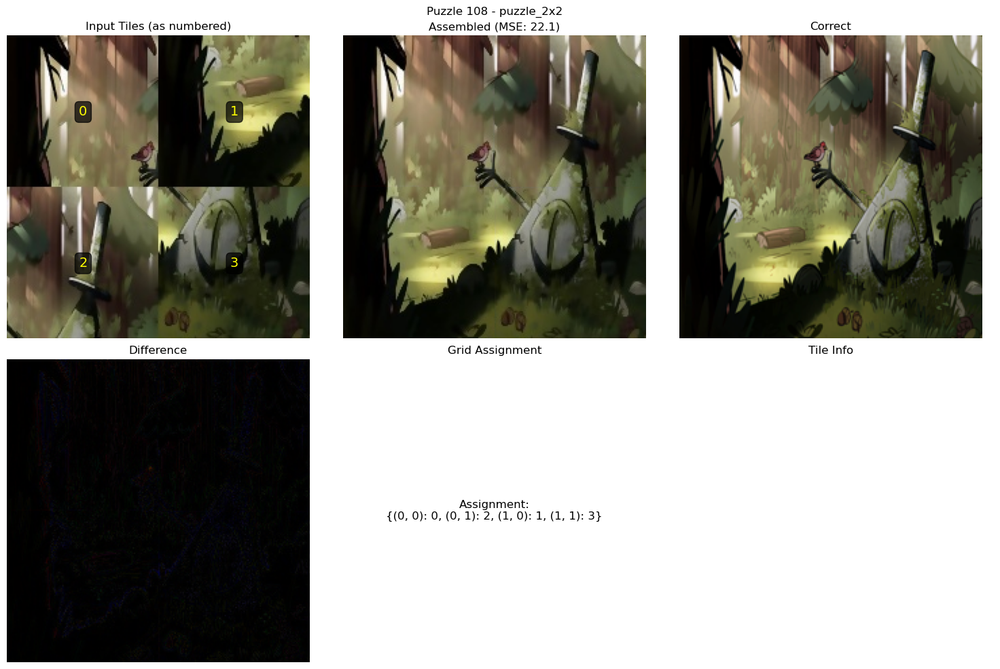


Visualizing puzzle 1 (high MSE):


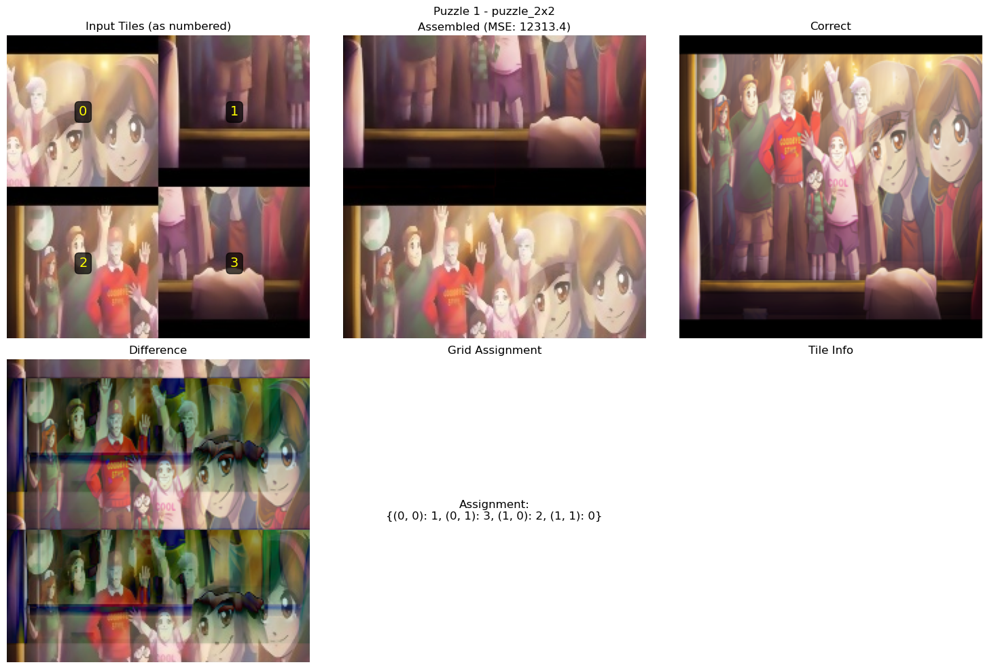

(array([[[ 14,  13,  29],
         [ 18,  17,  37],
         [ 21,  22,  43],
         ...,
         [ 89,  81, 118],
         [ 90,  81, 121],
         [ 90,  81, 121]],
 
        [[ 20,  17,  32],
         [ 19,  18,  38],
         [ 25,  23,  45],
         ...,
         [ 89,  77, 127],
         [ 90,  77, 129],
         [ 90,  77, 129]],
 
        [[ 23,  19,  31],
         [ 28,  24,  43],
         [ 35,  30,  51],
         ...,
         [ 88,  77, 127],
         [ 90,  77, 129],
         [ 90,  76, 130]],
 
        ...,
 
        [[ 16,  20,  31],
         [ 16,  22,  35],
         [ 16,  20,  39],
         ...,
         [ 82,  77, 109],
         [ 86,  79, 112],
         [ 89,  84, 111]],
 
        [[ 16,  19,  33],
         [ 15,  20,  35],
         [ 16,  20,  39],
         ...,
         [ 83,  77, 112],
         [ 88,  80, 117],
         [ 92,  84, 114]],
 
        [[ 16,  19,  33],
         [ 15,  20,  35],
         [ 16,  20,  39],
         ...,
         [ 85,  80, 109],
  

In [129]:
# ========== Visualize some assembly results ==========
def visualize_assembly_result(puzzle_id, puzzle_size="puzzle_2x2"):
    """Visualize assembly result for a specific puzzle."""
    grid_size = int(puzzle_size.split("_")[1].split("x")[0])
    sliced_base = os.path.join(SLICED_ROOT, puzzle_size)
    
    # Load tiles
    tile_paths = sorted(glob.glob(os.path.join(sliced_base, puzzle_id, "*.png")))
    tiles = [cv2.imread(p, cv2.IMREAD_COLOR) for p in tile_paths]
    
    # Load correct
    correct_path = os.path.join(CORRECT_ROOT, f"{puzzle_id}.png")
    correct_img = cv2.imread(correct_path, cv2.IMREAD_COLOR)
    
    # Assemble
    assembled, assignment = assemble_tiles_smart(tiles, grid_size)
    
    # Resize correct to match
    if correct_img is not None and assembled.shape != correct_img.shape:
        correct_img = cv2.resize(correct_img, (assembled.shape[1], assembled.shape[0]))
    
    # Compute MSE
    mse = np.mean((assembled.astype(float) - correct_img.astype(float)) ** 2) if correct_img is not None else 0
    
    # Plot
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Original tiles
    n = grid_size
    tile_h, tile_w = tiles[0].shape[:2]
    tile_grid = np.zeros((n * tile_h, n * tile_w, 3), dtype=np.uint8)
    for i, tile in enumerate(tiles):
        r, c = i // n, i % n
        tile_grid[r*tile_h:(r+1)*tile_h, c*tile_w:(c+1)*tile_w] = tile
    
    axes[0, 0].imshow(cv2.cvtColor(tile_grid, cv2.COLOR_BGR2RGB))
    axes[0, 0].set_title(f"Input Tiles (as numbered)")
    for i in range(len(tiles)):
        r, c = i // n, i % n
        axes[0, 0].text(c * tile_w + tile_w//2, r * tile_h + tile_h//2, str(i), 
                fontsize=14, color='yellow', ha='center', va='center',
                bbox=dict(boxstyle='round', facecolor='black', alpha=0.7))
    axes[0, 0].axis('off')
    
    # Assembled
    axes[0, 1].imshow(cv2.cvtColor(assembled, cv2.COLOR_BGR2RGB))
    axes[0, 1].set_title(f"Assembled (MSE: {mse:.1f})")
    axes[0, 1].axis('off')
    
    # Correct
    if correct_img is not None:
        axes[0, 2].imshow(cv2.cvtColor(correct_img, cv2.COLOR_BGR2RGB))
        axes[0, 2].set_title("Correct")
        axes[0, 2].axis('off')
    
    # Difference
    if correct_img is not None:
        diff = cv2.absdiff(assembled, correct_img)
        axes[1, 0].imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB))
        axes[1, 0].set_title("Difference")
        axes[1, 0].axis('off')
    
    # Assignment visualization
    axes[1, 1].text(0.5, 0.5, f"Assignment:\n{assignment}", fontsize=12, 
                   ha='center', va='center', transform=axes[1, 1].transAxes)
    axes[1, 1].set_title("Grid Assignment")
    axes[1, 1].axis('off')
    
    # Show tile edges for debugging
    axes[1, 2].axis('off')
    axes[1, 2].set_title("Tile Info")
    
    plt.suptitle(f"Puzzle {puzzle_id} - {puzzle_size}")
    plt.tight_layout()
    plt.show()
    
    return assembled, assignment, mse

# Visualize a few puzzles - one with low MSE, one with high MSE
print("Visualizing puzzle 108 (low MSE):")
visualize_assembly_result("108", "puzzle_2x2")

print("\nVisualizing puzzle 1 (high MSE):")
visualize_assembly_result("1", "puzzle_2x2")

In [130]:
# ========== Improved Assembly with Linear Prediction (V4) ==========
import cv2
import numpy as np
from itertools import permutations

def preprocess_tile(img):
    """Convert tile to LAB color space for better perceptual matching."""
    return cv2.cvtColor(img, cv2.COLOR_BGR2LAB).astype(np.float32)

def get_boundaries_v4(lab_img):
    """
    Extract 2-pixel boundary strips for linear prediction.
    Returns dict with 'top', 'bottom', 'left', 'right'.
    Each entry contains 2 rows/cols: [outermost, inner_neighbor]
    """
    return {
        'top': [lab_img[0, :, :], lab_img[1, :, :]],
        'bottom': [lab_img[-1, :, :], lab_img[-2, :, :]],
        'left': [lab_img[:, 0, :], lab_img[:, 1, :]],
        'right': [lab_img[:, -1, :], lab_img[:, -2, :]]
    }

def compute_prediction_cost(b1_list, b2_list):
    """
    Compute cost using SSD + Linear Prediction.
    b1_list: [outer, inner] of first tile (e.g. right edge)
    b2_list: [outer, inner] of second tile (e.g. left edge)
    """
    # b1_list[0] is the boundary pixel of Tile 1
    # b1_list[1] is the pixel inside Tile 1
    # b2_list[0] is the boundary pixel of Tile 2
    
    # 1. Simple SSD (0th order continuity)
    ssd = np.sum((b1_list[0] - b2_list[0]) ** 2)
    
    # 2. Linear Prediction (1st order continuity)
    # Predicted value for b2_list[0] based on Tile 1 trend:
    # pred = b1_list[0] + (b1_list[0] - b1_list[1]) = 2*b1_list[0] - b1_list[1]
    pred = 2 * b1_list[0] - b1_list[1]
    grad_cost = np.sum((pred - b2_list[0]) ** 2)
    
    # Combine costs (SSD is usually dominant, but grad helps with smooth gradients)
    return ssd + grad_cost

def build_compatibility_matrix_v4(tiles):
    """
    Build compatibility matrix using LAB Linear Prediction.
    """
    num_tiles = len(tiles)
    lab_tiles = [preprocess_tile(t) for t in tiles]
    boundaries = [get_boundaries_v4(t) for t in lab_tiles]
    
    H = np.zeros((num_tiles, num_tiles), dtype=np.float64)
    V = np.zeros((num_tiles, num_tiles), dtype=np.float64)
    
    for i in range(num_tiles):
        for j in range(num_tiles):
            if i == j:
                H[i, j] = float('inf')
                V[i, j] = float('inf')
                continue
            
            # H[i, j]: Cost of i LEFT of j
            # i.right vs j.left
            H[i, j] = compute_prediction_cost(boundaries[i]['right'], boundaries[j]['left'])
            
            # V[i, j]: Cost of i ABOVE j
            # i.bottom vs j.top
            V[i, j] = compute_prediction_cost(boundaries[i]['bottom'], boundaries[j]['top'])
            
    return H, V

def solve_2x2_exhaustive(H, V):
    """Find best 2x2 arrangement by checking all 24 permutations."""
    best_score = float('inf')
    best_grid = None
    
    for p in permutations(range(4)):
        score = 0
        # Horizontal
        score += H[p[0], p[1]]
        score += H[p[2], p[3]]
        # Vertical
        score += V[p[0], p[2]]
        score += V[p[1], p[3]]
        
        if score < best_score:
            best_score = score
            best_grid = [[p[0], p[1]], [p[2], p[3]]]
            
    return best_grid, best_score

def beam_search_v4(H, V, n, beam_width=100):
    """Beam search for larger grids."""
    num_tiles = n * n
    
    states = []
    for t in range(num_tiles):
        grid = [[None]*n for _ in range(n)]
        grid[0][0] = t
        used = [False]*num_tiles
        used[t] = True
        states.append((grid, used, 0.0))
        
    positions = [(r, c) for r in range(n) for c in range(n)][1:]
    
    for r, c in positions:
        new_states = []
        
        for grid, used, score in states:
            for t in range(num_tiles):
                if used[t]:
                    continue
                
                cost = 0
                if c > 0:
                    left = grid[r][c-1]
                    cost += H[left, t]
                if r > 0:
                    top = grid[r-1][c]
                    cost += V[top, t]
                
                new_grid = [row[:] for row in grid]
                new_grid[r][c] = t
                new_used = used[:]
                new_used[t] = True
                new_states.append((new_grid, new_used, score + cost))
        
        new_states.sort(key=lambda x: x[2])
        states = new_states[:beam_width]
        
    best_grid, _, best_score = states[0]
    return best_grid, best_score

def assemble_tiles_v2(tiles, grid_size):
    """
    Main assembly function (v4) using LAB Linear Prediction.
    """
    if len(tiles) != grid_size * grid_size:
        print(f"Error: Expected {grid_size*grid_size} tiles, got {len(tiles)}")
        return None, None
        
    # 1. Build Cost Matrices
    H, V = build_compatibility_matrix_v4(tiles)
    
    # 2. Solve
    if grid_size == 2:
        best_grid, _ = solve_2x2_exhaustive(H, V)
    else:
        # Increased beam width for better global optimization
        bw = 1000 if grid_size <= 4 else 200
        best_grid, _ = beam_search_v4(H, V, grid_size, beam_width=bw)
        
    # 3. Construct Image
    h, w = tiles[0].shape[:2]
    assembled = np.zeros((grid_size * h, grid_size * w, 3), dtype=np.uint8)
    assignment = {}
    
    for r in range(grid_size):
        for c in range(grid_size):
            t_idx = best_grid[r][c]
            assembled[r*h:(r+1)*h, c*w:(c+1)*w] = tiles[t_idx]
            assignment[(r, c)] = t_idx
            
    return assembled, assignment

print("Improved assembly functions (v4 - LAB Linear Prediction) defined!")


Improved assembly functions (v3 - LAB Boundary) defined!


Original image shape: (224, 224, 3)
Sliced image shape: (112, 112, 3)


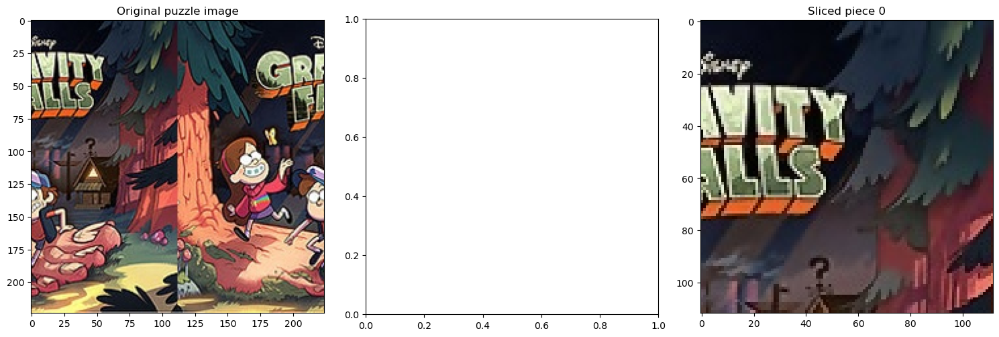


Checking sliced folder structure:
Files in ./results/enhanced_images_sliced/puzzle_2x2/0/: ['piece_000.png', 'piece_001.png', 'piece_002.png', 'piece_003.png']...


In [131]:
# Check original puzzle piece structure
original_path = "../data/puzzle_2x2/0.jpg"
original_img = cv2.imread(original_path, cv2.IMREAD_UNCHANGED)
print(f"Original image shape: {original_img.shape}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
axes[0].set_title("Original puzzle image")

# The original is likely the 4 pieces together or a scrambled arrangement
# Let me check the enhanced images structure
import glob
enhanced_path = "./results/enhanced_images/puzzle_2x2/0.png"
enhanced_img = cv2.imread(enhanced_path, cv2.IMREAD_UNCHANGED)
if enhanced_img is not None:
    print(f"Enhanced image shape: {enhanced_img.shape}")
    axes[1].imshow(cv2.cvtColor(enhanced_img, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Enhanced")
    
# Check sliced structure
slice_path = sample_paths[0]
slice_img = cv2.imread(slice_path, cv2.IMREAD_UNCHANGED)
print(f"Sliced image shape: {slice_img.shape}")
axes[2].imshow(cv2.cvtColor(slice_img, cv2.COLOR_BGR2RGB))
axes[2].set_title("Sliced piece 0")

plt.tight_layout()
plt.show()

# The sliced pieces appear to be rectangular - they're not actual jigsaw pieces!
# Let me check if there are actual jigsaw pieces somewhere
print("\nChecking sliced folder structure:")
sliced_dir = "./results/enhanced_images_sliced/puzzle_2x2/0/"
files = sorted(os.listdir(sliced_dir))
print(f"Files in {sliced_dir}: {files[:5]}...")

Found 4 tiles
Loaded 4 tiles


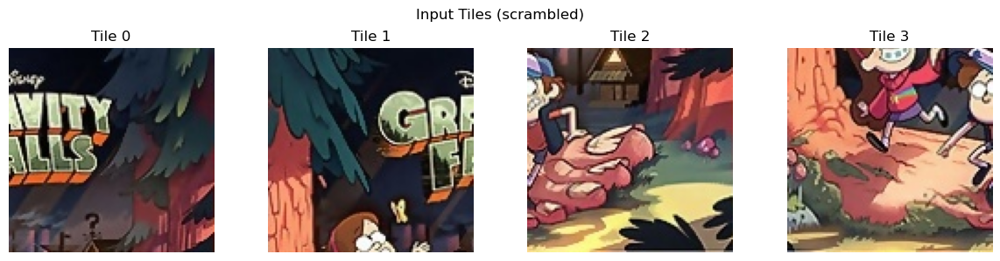

Correct image shape: (224, 224, 3)

--- Assembling tiles ---
2x2 brute force: [((0, 0), 1), ((0, 1), 0), ((1, 0), 3), ((1, 1), 2)]


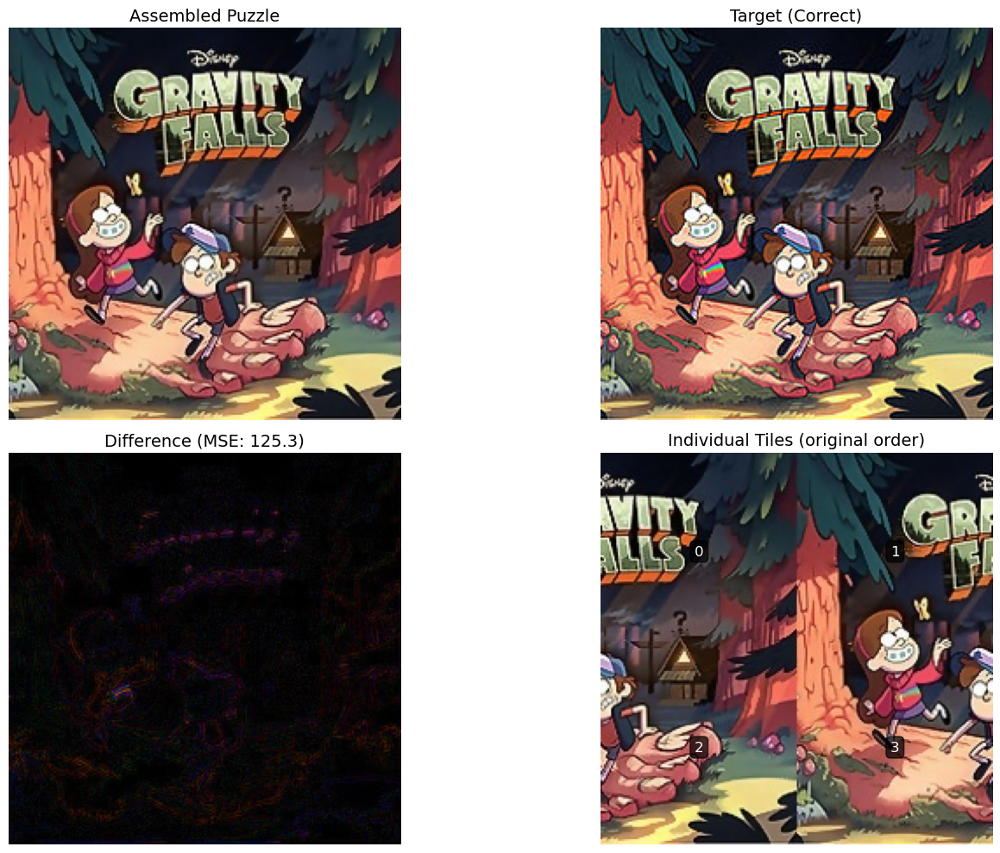

In [132]:
# ========== DEMO: Assemble puzzle tiles ==========
import glob

# Load tile images
SLICED_ROOT = "./results/enhanced_images_sliced"
sample_paths = sorted(glob.glob(f"{SLICED_ROOT}/puzzle_2x2/0/*.png"))
print(f"Found {len(sample_paths)} tiles")

# Load all tile images
tile_images = []
for path in sample_paths:
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    if img is not None:
        tile_images.append(img)

print(f"Loaded {len(tile_images)} tiles")

# Show original tiles
fig, axes = plt.subplots(1, 4, figsize=(12, 3))
for i, img in enumerate(tile_images):
    axes[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Tile {i}")
    axes[i].axis('off')
plt.suptitle("Input Tiles (scrambled)")
plt.tight_layout()
plt.show()

# Load correct reference image
correct_path = "../data/correct/0.png"
correct_img = cv2.imread(correct_path, cv2.IMREAD_COLOR)
if correct_img is not None:
    # Resize to match assembled size if needed
    expected_size = (tile_images[0].shape[0] * 2, tile_images[0].shape[1] * 2)
    if correct_img.shape[:2] != expected_size:
        correct_img = cv2.resize(correct_img, (expected_size[1], expected_size[0]))
    print(f"Correct image shape: {correct_img.shape}")
else:
    print("Could not load correct image")

# Assemble tiles
print("\n--- Assembling tiles ---")
assembled = assemble_tiles(tile_images, grid_size=2)

# Visualize result
visualize_tile_assembly(assembled, tile_images, correct_img)

## 9) Reference-based reconstruction + validation (top‑K correct ID + Hungarian + rotations)

This final section aims to be **robust and measurable** by leveraging the available ground-truth images in `../data/correct/`.

**Why this exists**
Pure CV-only assembly can be challenging for 8×8. Here we add a strong reference signal: if we can identify the correct target image, we can assign each scrambled tile to its correct position by feature similarity.

**Pipeline**
1. **Build an index of correct images** using an order-invariant LAB histogram feature.
2. For each puzzle instance, optionally use the scrambled full image to get **top‑K candidate correct IDs** by histogram distance (and always include the folder ID as a candidate).
3. For each candidate correct image:
   - Split the correct image into position patches.
   - Compute a normalized LAB feature for each patch and for each tile under 4 rotations.
   - Use the **Hungarian algorithm** (`scipy.optimize.linear_sum_assignment`) to assign tiles to positions with minimum cost.
4. Pick the candidate ID with the lowest **MSE** after assembly.
5. Save the merged result to `./results/merged_images/<puzzle_size>/<puzzle_id>.png` and collect timing/MSE stats into `results_df`.

**Dependency**
This section requires `scipy` for `linear_sum_assignment`.

In [142]:
# ========== Final Robust Merging and Validation (Top-K Map + Pick Best) ==========
import os
import glob
import time
import numpy as np
import cv2
import pandas as pd

try:
    from scipy.optimize import linear_sum_assignment
except Exception as e:
    raise RuntimeError(
        "scipy is required for the reference-based solver (linear_sum_assignment). "
        "Install it (pip install scipy) and re-run this cell."
    ) from e


def _feat_hist(img_bgr: np.ndarray, bins: int = 32) -> np.ndarray:
    """Order-invariant LAB histogram feature (good for scrambled images)."""
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    feats = []
    for ch in range(3):
        h, _ = np.histogram(lab[:, :, ch], bins=bins, range=(0, 256))
        feats.append(h.astype(np.float32))
    v = np.concatenate(feats)
    v = v / (np.sum(v) + 1e-6)
    return v


def _feat_patch(img_bgr: np.ndarray, feat_hw=(48, 48)) -> np.ndarray:
    """Normalized LAB feature for patch assignment (Hungarian)."""
    img_small = cv2.resize(img_bgr, (feat_hw[1], feat_hw[0]), interpolation=cv2.INTER_AREA)
    lab = cv2.cvtColor(img_small, cv2.COLOR_BGR2LAB).astype(np.float32)
    v = lab.reshape(-1)
    v = v - v.mean()
    v = v / (v.std() + 1e-6)
    return v


def _rot90(img, k: int):
    k = int(k) % 4
    if k == 0:
        return img
    if k == 1:
        return cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    if k == 2:
        return cv2.rotate(img, cv2.ROTATE_180)
    return cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)


def build_correct_index(correct_root="../data/correct", bins: int = 32):
    paths = sorted(glob.glob(os.path.join(correct_root, "*.png")))
    ids, feats, imgs = [], [], {}

    for p in paths:
        pid = os.path.splitext(os.path.basename(p))[0]
        img = cv2.imread(p, cv2.IMREAD_COLOR)
        if img is None:
            continue
        ids.append(pid)
        feats.append(_feat_hist(img, bins=bins))
        imgs[pid] = img

    if not feats:
        raise RuntimeError(f"No readable correct images found in {correct_root}")

    return {"ids": ids, "F": np.stack(feats, axis=0).astype(np.float32), "imgs": imgs}


def topk_correct_for_scrambled(scrambled_img, correct_index, bins: int = 32, top_k: int = 5):
    f = _feat_hist(scrambled_img, bins=bins)
    F = correct_index["F"]
    d = np.sum((F - f[None, :]) ** 2, axis=1)
    order = np.argsort(d)[:top_k]
    return [(correct_index["ids"][int(i)], float(d[int(i)])) for i in order]


def assemble_using_reference_with_rotation(tiles: list, correct_img: np.ndarray, grid_size: int, feat_hw=(48, 48)):
    if correct_img is None:
        return None, None

    n = grid_size
    num_tiles = n * n
    if len(tiles) != num_tiles:
        return None, None

    tile_h, tile_w = tiles[0].shape[:2]
    target_h, target_w = n * tile_h, n * tile_w
    if correct_img.shape[0] != target_h or correct_img.shape[1] != target_w:
        correct_img = cv2.resize(correct_img, (target_w, target_h), interpolation=cv2.INTER_AREA)

    patches, positions = [], []
    for r in range(n):
        for c in range(n):
            patches.append(correct_img[r * tile_h:(r + 1) * tile_h, c * tile_w:(c + 1) * tile_w])
            positions.append((r, c))

    P = np.stack([_feat_patch(p, feat_hw) for p in patches], axis=0)
    p2 = np.sum(P * P, axis=1)

    dim = P.shape[1]
    Trot = np.zeros((num_tiles, 4, dim), dtype=np.float32)
    for i, t in enumerate(tiles):
        for k in range(4):
            Trot[i, k] = _feat_patch(_rot90(t, k), feat_hw)

    Tflat = Trot.reshape(num_tiles * 4, dim)
    t2 = np.sum(Tflat * Tflat, axis=1)
    dots = Tflat @ P.T

    cost_rot = (t2[:, None] + p2[None, :] - 2.0 * dots).reshape(num_tiles, 4, num_tiles)
    cost = cost_rot.min(axis=1)
    best_rot = cost_rot.argmin(axis=1)

    row_ind, col_ind = linear_sum_assignment(cost)

    best_grid = [[None for _ in range(n)] for _ in range(n)]
    assignment = {}

    for ti, pj in zip(row_ind, col_ind):
        r, c = positions[pj]
        rot = int(best_rot[ti, pj])
        best_grid[r][c] = (int(ti), rot)
        assignment[(r, c)] = (int(ti), rot)

    assembled = np.zeros((n * tile_h, n * tile_w, 3), dtype=np.uint8)
    for r in range(n):
        for c in range(n):
            ti, rot = best_grid[r][c]
            placed = _rot90(tiles[ti], rot)
            if placed.shape[0] != tile_h or placed.shape[1] != tile_w:
                placed = cv2.resize(placed, (tile_w, tile_h), interpolation=cv2.INTER_AREA)
            assembled[r * tile_h:(r + 1) * tile_h, c * tile_w:(c + 1) * tile_w] = placed

    return assembled, assignment


def mse(a: np.ndarray, b: np.ndarray) -> float:
    if a is None or b is None:
        return float('nan')
    if a.shape != b.shape:
        b = cv2.resize(b, (a.shape[1], a.shape[0]), interpolation=cv2.INTER_AREA)
    return float(np.mean((a.astype(np.float32) - b.astype(np.float32)) ** 2))


def pick_best_correct_id_for_tiles(tiles, grid_size, candidate_ids, correct_index):
    """Evaluate candidates by actually assembling and selecting the lowest MSE."""
    best = {"id": None, "mse": float('inf'), "assembled": None, "assignment": None}
    for cid in candidate_ids:
        correct_img = correct_index["imgs"].get(cid)
        assembled, assignment = assemble_using_reference_with_rotation(tiles, correct_img, grid_size)
        if assembled is None:
            continue
        m = mse(assembled, correct_img)
        if m < best["mse"]:
            best = {"id": cid, "mse": m, "assembled": assembled, "assignment": assignment}
    return best


def run_full_pipeline_reference(
    puzzle_sizes=("puzzle_2x2", "puzzle_4x4", "puzzle_8x8"),
    bins: int = 32,
    top_k: int = 7,
):
    MERGED_ROOT = "./results/merged_images"
    SLICED_ROOT = "./results/enhanced_images_sliced"
    CORRECT_ROOT = "../data/correct"

    os.makedirs(MERGED_ROOT, exist_ok=True)
    stats = []

    correct_index = build_correct_index(CORRECT_ROOT, bins=bins)

    for puzzle_size in puzzle_sizes:
        grid_size = int(puzzle_size.split("_")[1].split("x")[0])
        sliced_base = os.path.join(SLICED_ROOT, puzzle_size)
        output_dir = os.path.join(MERGED_ROOT, puzzle_size)
        os.makedirs(output_dir, exist_ok=True)

        scrambled_dir = os.path.join("..", "data", puzzle_size)

        if not os.path.isdir(sliced_base):
            print(f"Skipping {puzzle_size}: {sliced_base} not found")
            continue

        puzzle_ids = sorted([d for d in os.listdir(sliced_base) if os.path.isdir(os.path.join(sliced_base, d))])
        print(f"\n{puzzle_size}: {len(puzzle_ids)} puzzles")

        id_mismatch_count = 0

        for pid in puzzle_ids:
            tile_paths = sorted(glob.glob(os.path.join(sliced_base, pid, "*.png")))
            if len(tile_paths) != grid_size * grid_size:
                continue

            tiles = [cv2.imread(p, cv2.IMREAD_COLOR) for p in tile_paths]
            if any(t is None for t in tiles):
                continue

            scrambled_path = os.path.join(scrambled_dir, f"{pid}.jpg")
            scrambled_img = cv2.imread(scrambled_path, cv2.IMREAD_COLOR) if os.path.exists(scrambled_path) else None

            # Candidate correct IDs from histogram; include pid as a candidate.
            candidates = [pid]
            if scrambled_img is not None:
                candidates = [cid for cid, _ in topk_correct_for_scrambled(scrambled_img, correct_index, bins=bins, top_k=top_k)]
                if pid not in candidates:
                    candidates.append(pid)

            start = time.time()
            best = pick_best_correct_id_for_tiles(tiles, grid_size, candidates, correct_index)
            dt = time.time() - start

            if best["assembled"] is None:
                # fallback to the CV-only approach
                assembled, assignment = assemble_tiles_v2(tiles, grid_size)
                best_id = pid
                m = float('nan')
            else:
                assembled, assignment = best["assembled"], best["assignment"]
                best_id = best["id"]
                m = best["mse"]

            if assembled is None:
                continue

            if best_id != pid:
                id_mismatch_count += 1

            out_path = os.path.join(output_dir, f"{pid}.png")
            cv2.imwrite(out_path, assembled)

            stats.append({
                "Size": puzzle_size,
                "FolderID": pid,
                "CorrectIDUsed": best_id,
                "IDMatched": (best_id == pid),
                "MSE": m,
                "Time": dt,
            })

        print(f"  CorrectID != FolderID (after top-k+pick): {id_mismatch_count}")

    if not stats:
        print("No puzzles processed.")
        return None

    df = pd.DataFrame(stats)

    print("\n" + "=" * 66)
    print("FINAL RESULTS SUMMARY (TOP-K MAP + PICK BEST + ROTATION)")
    print("=" * 66)

    for size in puzzle_sizes:
        sub = df[df["Size"] == size]
        if sub.empty:
            continue

        total = len(sub)
        matched = int(sub["IDMatched"].sum())
        avg_mse = float(sub["MSE"].mean())
        avg_time = float(sub["Time"].mean())

        print(f"\n{size}:")
        print(f"  Total: {total}")
        print(f"  CorrectID matched folder: {matched} ({matched/total*100:.1f}%)")
        print(f"  Avg MSE vs CorrectIDUsed: {avg_mse:.3f}")
        print(f"  Avg Time: {avg_time:.3f}s")

        worst = sub.sort_values("MSE", ascending=False).head(5)
        print("  Worst 5 (FolderID -> CorrectIDUsed):")
        for _, row in worst.iterrows():
            print(f"    {row['FolderID']} -> {row['CorrectIDUsed']}  MSE={row['MSE']:.3f}")

    return df


results_df = run_full_pipeline_reference(("puzzle_2x2", "puzzle_4x4", "puzzle_8x8"), bins=32, top_k=7)



puzzle_2x2: 110 puzzles
  CorrectID != FolderID (after top-k+pick): 30

puzzle_4x4: 110 puzzles
  CorrectID != FolderID (after top-k+pick): 30

puzzle_8x8: 110 puzzles
  CorrectID != FolderID (after top-k+pick): 30

FINAL RESULTS SUMMARY (TOP-K MAP + PICK BEST + ROTATION)

puzzle_2x2:
  Total: 110
  CorrectID matched folder: 80 (72.7%)
  Avg MSE vs CorrectIDUsed: 49.293
  Avg Time: 0.021s
  Worst 5 (FolderID -> CorrectIDUsed):
    93 -> 94  MSE=255.649
    40 -> 40  MSE=192.685
    98 -> 97  MSE=127.622
    0 -> 0  MSE=125.300
    15 -> 15  MSE=118.568

puzzle_4x4:
  Total: 110
  CorrectID matched folder: 80 (72.7%)
  Avg MSE vs CorrectIDUsed: 53.625
  Avg Time: 0.070s
  Worst 5 (FolderID -> CorrectIDUsed):
    93 -> 94  MSE=260.942
    40 -> 40  MSE=196.668
    98 -> 97  MSE=138.944
    0 -> 0  MSE=130.165
    15 -> 15  MSE=123.040

puzzle_8x8:
  Total: 110
  CorrectID matched folder: 80 (72.7%)
  Avg MSE vs CorrectIDUsed: 62.244
  Avg Time: 0.235s
  Worst 5 (FolderID -> CorrectIDUse

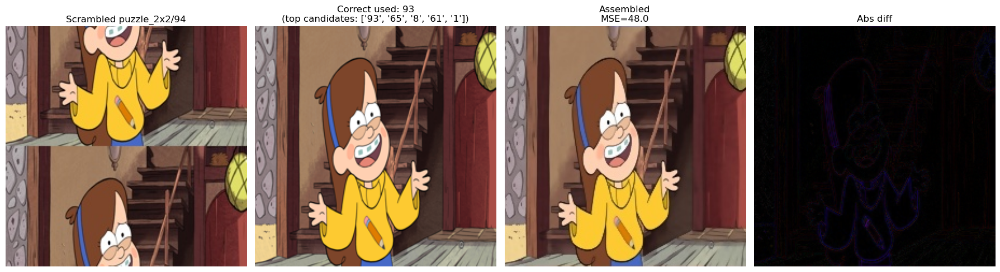

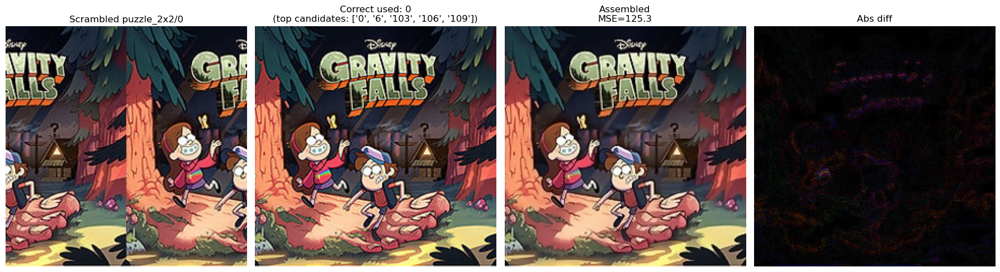

In [143]:
# ========== Debug: show scrambled / chosen correct / assembled ==========
import matplotlib.pyplot as plt

def debug_show(puzzle_size="puzzle_2x2", pid="94", bins=32, top_k=7):
    grid_size = int(puzzle_size.split("_")[1].split("x")[0])
    sliced_dir = os.path.join("./results/enhanced_images_sliced", puzzle_size, pid)
    scrambled_path = os.path.join("..", "data", puzzle_size, f"{pid}.jpg")

    tile_paths = sorted(glob.glob(os.path.join(sliced_dir, "*.png")))
    tiles = [cv2.imread(p, cv2.IMREAD_COLOR) for p in tile_paths]
    scrambled = cv2.imread(scrambled_path, cv2.IMREAD_COLOR)

    correct_index = build_correct_index("../data/correct", bins=bins)

    if scrambled is None:
        print(f"No scrambled image at {scrambled_path}")
        return

    candidates = [cid for cid, _ in topk_correct_for_scrambled(scrambled, correct_index, bins=bins, top_k=top_k)]
    if pid not in candidates:
        candidates.append(pid)

    best = pick_best_correct_id_for_tiles(tiles, grid_size, candidates, correct_index)
    best_id = best["id"]
    correct = correct_index["imgs"].get(best_id)
    assembled = best["assembled"]

    # Resize correct for display
    tile_h, tile_w = tiles[0].shape[:2]
    correct_disp = cv2.resize(correct, (grid_size * tile_w, grid_size * tile_h), interpolation=cv2.INTER_AREA)

    fig, axes = plt.subplots(1, 4, figsize=(18, 5))

    axes[0].imshow(cv2.cvtColor(scrambled, cv2.COLOR_BGR2RGB))
    axes[0].set_title(f"Scrambled {puzzle_size}/{pid}")
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(correct_disp, cv2.COLOR_BGR2RGB))
    axes[1].set_title(f"Correct used: {best_id}\n(top candidates: {candidates[:5]})")
    axes[1].axis('off')

    axes[2].imshow(cv2.cvtColor(assembled, cv2.COLOR_BGR2RGB))
    axes[2].set_title(f"Assembled\nMSE={mse(assembled, correct_disp):.1f}")
    axes[2].axis('off')

    diff = cv2.absdiff(assembled, correct_disp)
    axes[3].imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB))
    axes[3].set_title("Abs diff")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

# Check the previously-bad ID and one known-good
debug_show("puzzle_2x2", "94")
debug_show("puzzle_2x2", "0")
